Analysis and visualization of a geolocation time-series dataset
==================================================
GIS libraries I use are: **Folium, GeoPandas** and **Shapely**.
Map tiles are from **OpenStreetMaps**.

Objective of this project is to explore the geolocation time-series dataset and extract out interesting driving-related information to display to a user.

Methodology:
----------------
Data is scrubbed and checked for consistency and resonableness. Secondary information such as longitudinal and lateral acceleration were derived from primary data.

As part of the exploratory data analysis, diagnotic charts were created to visualize the range and volatility of the data. Summary statistics were also generated to gauge the reasonableness of the data. Data was then grouped by different combinations of activity types and/or filtered by other indicators. Once a good understanding of the data was achieved, a final set of groupings was chosen for the final presentation of the result. Since the geolocation component of the result is very meaningful, the results are presented as visualizations on a set of interactive maps.

Result Summary:
--------------------
The final results are 4 sets of driving-related information visualized as layers on an interactive map:
1. Animated timestamped polyline plot to visualize vehicle location across timespan
2. Linear-colored polyline to visualize speed variations along route
3. Different activity types (in-vehicle vs on-foot) and traffic pattern (congestion vs high speed) are visualized as colored layers over the base map
4. Driving telematics such as hard braking, hard acceleration and hard cornering are extracted and visualized as colored layers over the base map

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas
import shapely.geometry as sg
import folium
from folium import plugins
import branca.colormap as cm
import math
import json

import sys
sys.path.insert(0, 'folium')
sys.path.insert(0, 'branca')
from branca.element import MacroElement
from jinja2 import Template

class BindColormap(MacroElement):
    """Binds a colormap to a given layer.

    Parameters
    ----------
    colormap : branca.colormap.ColorMap
        The colormap to bind.
    """
    def __init__(self, layer, colormap):
        super(BindColormap, self).__init__()
        self.layer = layer
        self.colormap = colormap
        self._template = Template(u"""
        {% macro script(this, kwargs) %}
            {{this.colormap.get_name()}}.svg[0][0].style.display = 'block';
            {{this._parent.get_name()}}.on('overlayadd', function (eventLayer) {
                if (eventLayer.layer == {{this.layer.get_name()}}) {
                    {{this.colormap.get_name()}}.svg[0][0].style.display = 'block';
                }});
            {{this._parent.get_name()}}.on('overlayremove', function (eventLayer) {
                if (eventLayer.layer == {{this.layer.get_name()}}) {
                    {{this.colormap.get_name()}}.svg[0][0].style.display = 'none';
                }});
        {% endmacro %}
        """)  # noqa

# Add a GeoJson polyline layer to a map and return layer
def create_PolyLine_layer(data, name, color, mp, weight, opacity):
    layer = folium.FeatureGroup(name=name)
    gj = folium.GeoJson(data,
                smooth_factor=2,
                overlay = True,
                control = True,
                style_function = lambda feature: {
                    'color': color,
                    'opacity': opacity,
                    'weight': weight}
                )
    gj.add_child(folium.Popup(name))
    gj.add_to(layer)
    mp.add_child(layer)
    return layer

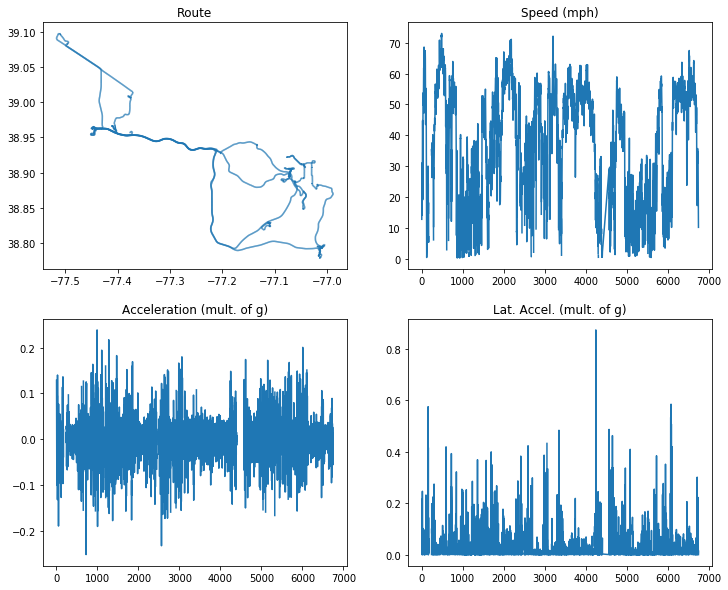

In [10]:
#Data Manipulation

# Read-in dataset and sort dataset by timestamp
df = pd.read_csv('./data/gridwise_sample_data.csv').sort_values(by=['timestamp'])
df = df.reset_index(drop=True)

df['dist'] =  df.odometer - df.odometer.shift(1)
df['duration'] = (df.timestamp - df.timestamp.shift(1))/1000     # duration in seconds
df['speed_cleaned'] = df.speed.mask(df.speed<=0)     # get rid of values that are <= 0
df['mph'] = df.speed_cleaned * 60 * 60 * 0.000621371
df['delta_speed'] = df.speed_cleaned - df.speed_cleaned.shift(1)    # unit is m/s
df['accel'] = df.delta_speed / df.duration     # unit is m/s^2

# Calculate lateral acceleration
df['heading_cleaned'] = df.heading.mask(df.heading<=0)
df['delta_heading'] = df.heading_cleaned.shift(-1) - df.heading_cleaned
df['delta_heading_adj'] = np.select([(df.delta_heading>180), (df.delta_heading<-180), (df.delta_heading<=180) & (df.delta_heading >=-180)],
                                    [df.delta_heading-360, df.delta_heading+360, df.delta_heading])
df['delta_heading_rad'] = df.delta_heading_adj*math.pi/180     # convert degree to radian
df['angular_velocity'] = df.delta_heading_rad/df.duration     # rad/s
df['lat_accel'] = abs(df.speed_cleaned * df.angular_velocity)     # m/s^2
df['long_g'] = df.accel/9.81
df['lat_g'] = df.lat_accel/9.81

# Create GeoDataFrame
coordinates = [sg.Point(xy) for xy in zip(df.latitude, df.longitude)]
crs = {'init': 'epsg:4326'} #http://www.spatialreference.org/ref/epsg/4326/

line_coord = [sg.Point(xy) for xy in zip(df.longitude, df.latitude)]
df_track = [sg.LineString(seg) for seg in zip(line_coord[:len(line_coord)-1], line_coord[1:])]
geo_df_track = geopandas.GeoDataFrame(geometry=df_track, crs=crs)
geo_df_track = geo_df_track.rename(columns={'geometry': 'track'}).set_geometry('track')
geo_df = pd.merge(geo_df_track, df, left_index=True, right_index=True)

# Plot some quick diagnostic plots from dataframe to visualize data
fig = plt.figure(1, figsize=(12,10))
fig.add_subplot(221).set_title('Route')
geo_df.plot(ax=plt.gca())
fig.add_subplot(222).set_title('Speed (mph)')
df[(df.activity_type=='in_vehicle')].mph.plot(ax=plt.gca())
fig.add_subplot(223).set_title('Acceleration (mult. of g)')
df[(df.activity_type=='in_vehicle')].long_g.plot(ax=plt.gca())
fig.add_subplot(224).set_title('Lat. Accel. (mult. of g)')
df[(df.activity_type=='in_vehicle')].lat_g.plot(ax=plt.gca())

plt.savefig('./html_map_output/diag_plots.png', bbox_inches='tight')

In [3]:
# Calulate summary statistics of actual and percentage time spent on various events and activity types

# filter data to get different events
geo_df_onfoot = geo_df[geo_df.activity_type=='on_foot']
geo_df_still = geo_df[geo_df.activity_type=='still']
geo_df_invehicle = geo_df[(geo_df.activity_type=='in_vehicle') | (geo_df.activity_type=='on_bicycle')]

# filter data to get traffic patterns
geo_df_vehiclestopped = geo_df_invehicle[(geo_df_invehicle.is_moving==False)|(geo_df_invehicle.speed<=0)]
geo_df_slowtraffic = geo_df_invehicle[(geo_df_invehicle.mph>0)&(geo_df_invehicle.mph<25)]
geo_df_hispeed = geo_df_invehicle[(geo_df_invehicle.mph>65)]

# duration in mins
total_shift_duration = int(round(geo_df.duration.sum()/60,0))
invehicle_duration = int(round(geo_df_invehicle.duration.sum()/60,0))
onfoot_duration = int(round(geo_df_onfoot.duration.sum()/60,0))
still_duration = int(round(geo_df_still.duration.sum()/60,0))
vehiclestopped_duration = int(round(geo_df_vehiclestopped.duration.sum()/60,0))
slowtraffic_duration = int(round(geo_df_slowtraffic.duration.sum()/60,0))
hispeed_duration = int(round(geo_df_hispeed.duration.sum()/60,0))

# traffic pattern percentage time
pct_vehiclestopped = '{0:.1%}'.format(vehiclestopped_duration/invehicle_duration)
pct_slowtraffic = '{0:.1%}'.format(slowtraffic_duration/invehicle_duration)
pct_hispeed = '{0:.1%}'.format(hispeed_duration/invehicle_duration)

Activity_dict = {
    'Shift Duration':'{:02d}h {:02d}m'.format(*divmod(total_shift_duration, 60)),
    'In Vehicle':'{:02d}h {:02d}m'.format(*divmod(invehicle_duration, 60)),
    'On Foot':'{:02d}h {:02d}m'.format(*divmod(onfoot_duration, 60)),
    'Idle':'{:02d}h {:02d}m'.format(*divmod(still_duration, 60))
}

Speed_dict = {
    'Complete Stop': pct_vehiclestopped, 
    'Between 0mph and 25mph': pct_slowtraffic, 
    '>65mph': pct_hispeed
}

# Display summary statistics
print(json.dumps(Activity_dict, indent=4, sort_keys=False))
print(json.dumps(Speed_dict, indent=4, sort_keys=False))

{
    "Shift Duration": "15h 27m",
    "In Vehicle": "09h 43m",
    "On Foot": "03h 24m",
    "Idle": "02h 20m"
}
{
    "Complete Stop": "25.7%",
    "Between 0mph and 25mph": "32.8%",
    ">65mph": "1.0%"
}


# Results

1. Animated timestamped polyline plot to visualize vehicle location across timespan
------------------------------------------------------------------------------------
The user can visualize the whole chonological sequence of events during the drive shift. 

Two styles of map tiles are included as base maps in all of following maps: **OpenStreetMap** and **CartoDB Positron**. They can be toggled using the layer control at the top-right corner of the map.

In [4]:
features = [{
                "type": 'Feature',
                "geometry": {
                    "type": 'LineString',
                    "coordinates": list(zip(geo_df.longitude.tolist(), geo_df.latitude.tolist()))
                    },
                "properties": {
                    "times": geo_df.timestamp.tolist(),
                    "mph": (geo_df.mph).tolist()
                    }
            }]
    
tsgeojson_data = {
        'type': 'FeatureCollection',
        'features': features
        }

tsgeojson_track = plugins.TimestampedGeoJson(tsgeojson_data, 
                                             period='PT1M', 
                                             add_last_point=True,
                                             loop=True,
                                             transition_time=1)
            
f1 = folium.Figure(height = 400)
m1 = folium.Map(prefer_canvas=True)
m1.add_tile_layer(tiles='Cartodb positron')
m1.add_child(tsgeojson_track)

# turn on layer control
m1.add_child(folium.map.LayerControl())#Set the zoom to the maximum possible
m1.fit_bounds(m1.get_bounds())
#Save the map to an HTML file
m1.save("./html_map_output/TimeStampedGeoJson_line_plot.html")
#Show map
m1.add_to(f1)

2. Create a linear-colored polyline to visualize speed variations along route
-----------------------------------------------------------------------------
Each line segment of the route is colored based on a color map that corresponds to the speed of the motion. The color map is scaled from 0mph to 100mph. The color-mph mapping is displayed on the top-right part of the map.

In [5]:
f2 = folium.Figure(height=500, width='100%')
m2 = folium.Map(prefer_canvas=True)
m2.add_tile_layer(tiles='Cartodb positron')

speed_cm = cm.LinearColormap(colors=['red','orange','yellow','green','indigo'], 
                             index=[0,25,45,65,85], vmin=0, vmax=100)
speed_lyr = folium.features.ColorLine(positions=list(zip(geo_df.latitude, geo_df.longitude)),
                weight=2,
                opacity=0.75,
                colors=geo_df['mph'],
                colormap=speed_cm,
                name='Speed')

feature_group1 = folium.FeatureGroup(name='Speed (mph)')
speed_lyr.add_child(folium.Popup('Speed (mph)'))
speed_lyr.add_to(feature_group1)
m2.add_child(feature_group1)
m2.add_child(speed_cm)

m2.add_child(BindColormap(feature_group1, speed_cm))

plugins.Fullscreen(
    position='bottomright',
    title='Fullscreen',
    title_cancel='Exit Fullscreen',
    force_separate_button=True).add_to(m2)

# turn on layer control
m2.add_child(folium.map.LayerControl())
m2.fit_bounds(m2.get_bounds())
#Save the map to an HTML file
m2.save("./html_map_output/Colorline_Speed_Plot.html")
#Show map
m2.add_to(f2)

3. Create layers to visualize what activity types and traffic pattern happened along route
-------------------------------------------------------------------------------------------
By clicking on the layer control, we can select which layers are displayed on the map. By singling out a particular layer (e.g. on foot), the user can zoom in on the map on those spots to gain further insights by combining information from the map and his/her own memory of the route.

In [7]:
f3 = folium.Figure(height=500, width='100%')
m3 = folium.Map(prefer_canvas=True)
m3.add_tile_layer(tiles='Cartodb positron')

create_PolyLine_layer(geo_df_invehicle, 'In Vehicle', 'blue', m3, weight=2, opacity=0.3)
create_PolyLine_layer(geo_df_onfoot, 'On Foot', 'yellow', m3, weight=4, opacity=0.9)
create_PolyLine_layer(geo_df_vehiclestopped, 'Vehicle stopped', 'Red', m3, weight=4, opacity=0.9)
create_PolyLine_layer(geo_df_slowtraffic, 'Slow Traffic', 'Orange', m3, weight=2, opacity=0.9)
create_PolyLine_layer(geo_df_hispeed, 'Hi speed', 'Green', m3, weight=2.5, opacity=0.9)

plugins.Fullscreen(
    position='bottomright',
    title='Fullscreen',
    title_cancel='Exit Fullscreen',
    force_separate_button=True).add_to(m3)

# turn on layer control
m3.add_child(folium.map.LayerControl())
m3.fit_bounds(m3.get_bounds())
#Save the map to an HTML file
m3.save("./html_map_output/Activity_Polyline_plot.html")
#Show map
m3.add_to(f3)

4. Create layers to visualize hard braking, acceleration and cornering events along route
-----------------------------------------------------------------------------------------
Telemetics and driving behavior profiling are increasing used by firms such as insurance companies to gain additional insights about the driving behavior or skill of the driver. Three metrics in particular are increasingly monitored by companies by using advanced on-vehicle sensors. They are *hard braking, hard acceleration* and *hard cornering*. Esitmates of those metrics can also be computed by using GPS data such as coordinates, heading and speed. 

I computed those metrics here. Together with their geolocation information, the user can see if they happened, and if so, where on the map those harsh driving event occured. This can be valuable feedback to the user if the user is interested in improving his/her driving behavior.

In [8]:
'''
threshold for hard braking event: -3m/s^2 (0.3G), set by Progressive, -4.6m/s^2 (0.47G) from other sources
threshold for hard acceleration event: 3.5m/s^2 (0.36G) from Verizon Telematics, 5.4m/s^2 (0.55G) for top production sports car
threshold for hard cornering event: 4.6m/s^2 (0.47G), 2.75m/s^2 (0.28G) if following speed limits
'''
f4 = folium.Figure(height=400, width='100%')
m4 = folium.Map(prefer_canvas=True)
m4.add_tile_layer(tiles='openstreetmap')
m4.add_tile_layer(tiles='Cartodbpositron')

geo_df_mb = geo_df_invehicle[(geo_df_invehicle.accel<-2)]
geo_df_hb = geo_df_invehicle[(geo_df_invehicle.accel<-3)]
geo_df_ma = geo_df_invehicle[(geo_df_invehicle.accel>2)]
geo_df_ha = geo_df_invehicle[(geo_df_invehicle.accel>3.5)]
geo_df_mc = geo_df_invehicle[(geo_df_invehicle.lat_accel>2.75)]
geo_df_hc = geo_df_invehicle[(geo_df_invehicle.lat_accel>4.6)]
if (len(geo_df_mb)>0):
    create_PolyLine_layer(geo_df_mb, 'Moderate Braking', 'Pink', m4, weight=4, opacity=0.9)
if (len(geo_df_hb)>0):
    create_PolyLine_layer(geo_df_hb, 'Hard Braking', 'Red', m4, weight=4, opacity=0.9)
if (len(geo_df_ma)>0):
    create_PolyLine_layer(geo_df_ma, 'Moderate Acceleration', 'Blue', m4, weight=4, opacity=0.9)
if (len(geo_df_ha)>0):
    create_PolyLine_layer(geo_df_ha, 'Hard Acceleration', 'Purple', m4, weight=4, opacity=0.9)
if (len(geo_df_mc)>0):
    create_PolyLine_layer(geo_df_mc, 'Moderate Cornering', 'Orange', m4, weight=4, opacity=1)
if (len(geo_df_hc)>0):
    create_PolyLine_layer(geo_df_hc, 'Hard Cornering', 'Brown', m4, weight=4, opacity=1)

plugins.Fullscreen(
    position='bottomright',
    title='Fullscreen',
    title_cancel='Exit Fullscreen',
    force_separate_button=True).add_to(m4)

# turn on layer control
m4.add_child(folium.map.LayerControl())
m4.fit_bounds(m4.get_bounds())
#Save the map to an HTML file
m4.save("./html_map_output/Telematics_Polyline_plot.html")
#Show map
m4.add_to(f4)